In [56]:
!git clone https://github.com/PremSavariya/Track

fatal: destination path 'Track' already exists and is not an empty directory.


In [57]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
import cv2
import pandas as pd
import random
import os
from imgaug import augmenters as iaa
import matplotlib.image as mp

In [58]:
datadir = 'Track'
columns = ['centre', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,centre,left,right,steering,throttle,reverse,speed
0,D:\Autonomous car\Data\IMG\center_2024_06_03_11_29_04_423.jpg,D:\Autonomous car\Data\IMG\left_2024_06_03_11_29_04_423.jpg,D:\Autonomous car\Data\IMG\right_2024_06_03_11_29_04_423.jpg,0.0,0.0,0.0,0.000078
1,D:\Autonomous car\Data\IMG\center_2024_06_03_11_29_04_526.jpg,D:\Autonomous car\Data\IMG\left_2024_06_03_11_29_04_526.jpg,D:\Autonomous car\Data\IMG\right_2024_06_03_11_29_04_526.jpg,0.0,0.0,0.0,0.000078
2,D:\Autonomous car\Data\IMG\center_2024_06_03_11_29_04_629.jpg,D:\Autonomous car\Data\IMG\left_2024_06_03_11_29_04_629.jpg,D:\Autonomous car\Data\IMG\right_2024_06_03_11_29_04_629.jpg,0.0,0.0,0.0,0.000078
3,D:\Autonomous car\Data\IMG\center_2024_06_03_11_29_04_731.jpg,D:\Autonomous car\Data\IMG\left_2024_06_03_11_29_04_731.jpg,D:\Autonomous car\Data\IMG\right_2024_06_03_11_29_04_731.jpg,0.0,0.0,0.0,0.000078
4,D:\Autonomous car\Data\IMG\center_2024_06_03_11_29_04_833.jpg,D:\Autonomous car\Data\IMG\left_2024_06_03_11_29_04_833.jpg,D:\Autonomous car\Data\IMG\right_2024_06_03_11_29_04_833.jpg,0.0,0.0,0.0,0.000081


In [59]:
import ntpath

def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

data['centre'] = data['centre'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,centre,left,right,steering,throttle,reverse,speed
0,center_2024_06_03_11_29_04_423.jpg,left_2024_06_03_11_29_04_423.jpg,right_2024_06_03_11_29_04_423.jpg,0.0,0.0,0.0,0.000078
1,center_2024_06_03_11_29_04_526.jpg,left_2024_06_03_11_29_04_526.jpg,right_2024_06_03_11_29_04_526.jpg,0.0,0.0,0.0,0.000078
2,center_2024_06_03_11_29_04_629.jpg,left_2024_06_03_11_29_04_629.jpg,right_2024_06_03_11_29_04_629.jpg,0.0,0.0,0.0,0.000078
3,center_2024_06_03_11_29_04_731.jpg,left_2024_06_03_11_29_04_731.jpg,right_2024_06_03_11_29_04_731.jpg,0.0,0.0,0.0,0.000078
4,center_2024_06_03_11_29_04_833.jpg,left_2024_06_03_11_29_04_833.jpg,right_2024_06_03_11_29_04_833.jpg,0.0,0.0,0.0,0.000081


[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]
[-0.96 -0.88 -0.8  -0.72 -0.64 -0.56 -0.48 -0.4  -0.32 -0.24 -0.16 -0.08
  0.    0.08  0.16  0.24  0.32  0.4   0.48  0.56  0.64  0.72  0.8   0.88
  0.96]
[  59   12   15   23   20   32   35   42   54   39   54   48 1299   30
   45   42   35   26   22   29   18    9    9   10  135]


<BarContainer object of 25 artists>

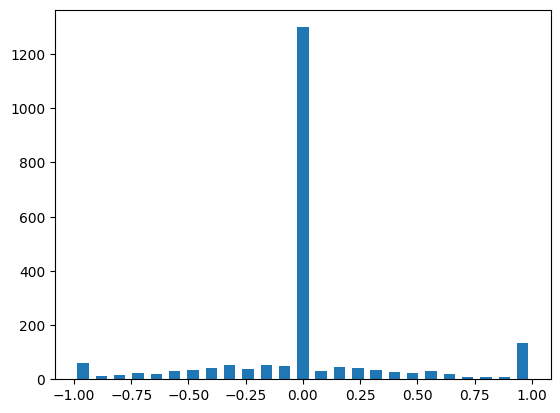

In [60]:
num_bins = 25
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
print(bins)
print(center)
print(hist)
plt.bar(center, hist, width=0.05)

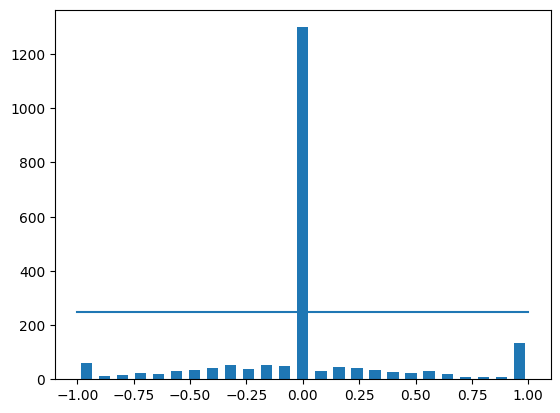

In [61]:
samples_per_bin = 250
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 2142
removed: 1049
remaining: 1093


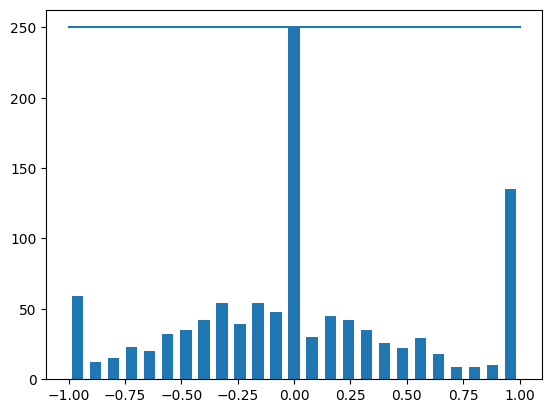

In [62]:
from sklearn.utils import shuffle

print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)
    
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [63]:
from sklearn.model_selection import train_test_split

print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

centre      center_2024_06_03_11_29_05_341.jpg
left          left_2024_06_03_11_29_05_341.jpg
right        right_2024_06_03_11_29_05_341.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                 0.000078
Name: 9, dtype: object


C:\Users\prems\AppData\Local\Temp\ipykernel_13856\3308925056.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\prems\AppData\Local\Temp\ipykernel_13856\3308925056.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))


In [64]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training samples: {}\nValid samples: {}'.format(len(X_train), len(X_valid)))

Training samples: 874
Valid samples: 219


Text(0.5, 1.0, 'Validation set')

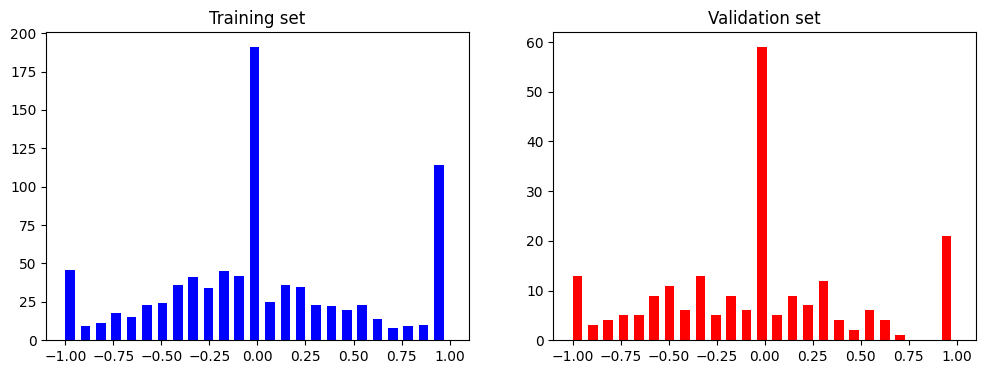

In [65]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [66]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

Text(0.5, 1.0, 'Zoom Image')

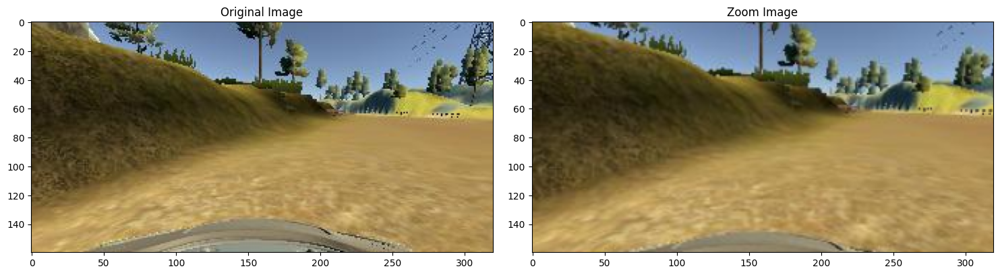

In [67]:
image = image_paths[random.randint(0, 1000)]
original_image = mp.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoom Image')

In [68]:
def pan(image):
    pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

Text(0.5, 1.0, 'Panned Image')

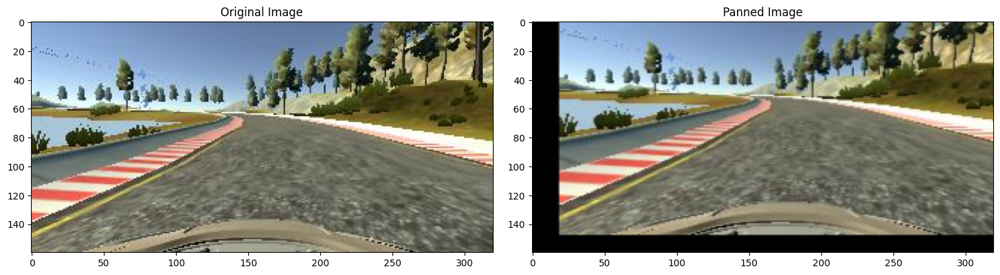

In [69]:
image = image_paths[random.randint(0, 1000)]
original_image = mp.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [70]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Brightness Altered Image')

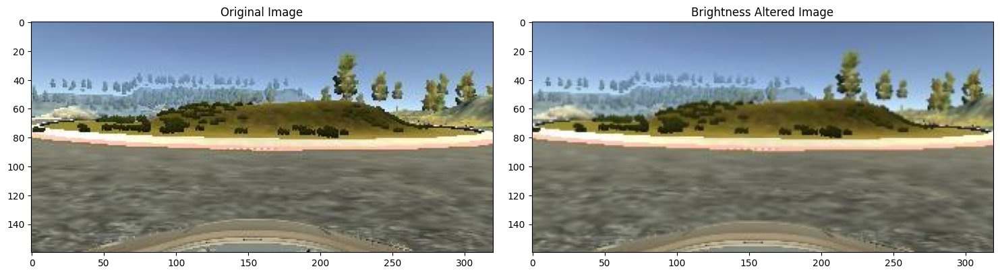

In [71]:
image = image_paths[random.randint(0, 1000)]
original_image = mp.imread(image)
brightness_altered_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

In [72]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-1.0')

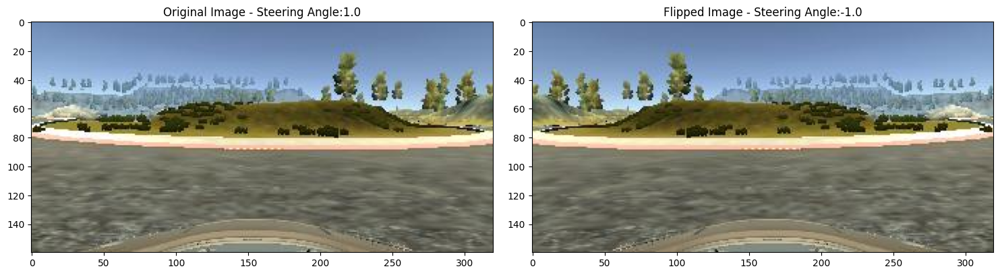

In [73]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mp.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [74]:
def random_augment(image, steering_angle):
    image = mp.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle

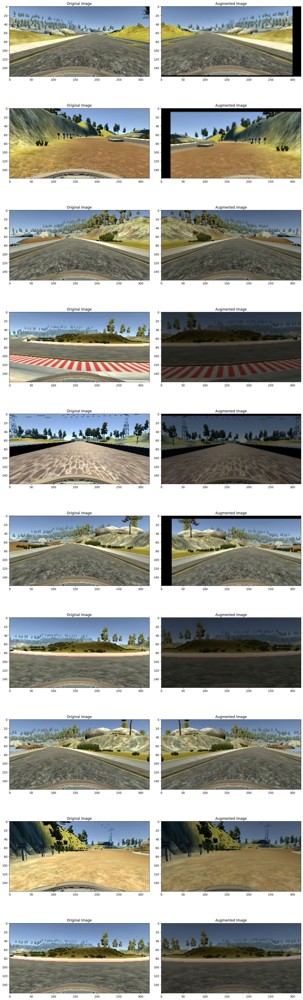

In [75]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]
    
    original_image = mp.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)
    
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")
    
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

In [76]:
def img_preprocess(img):
    img = mp.imread(img)
    img = img[60:135, :,: ]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66 ))
    img = img / 255
    return img


Text(0.5, 1.0, 'Preprocessed Image')

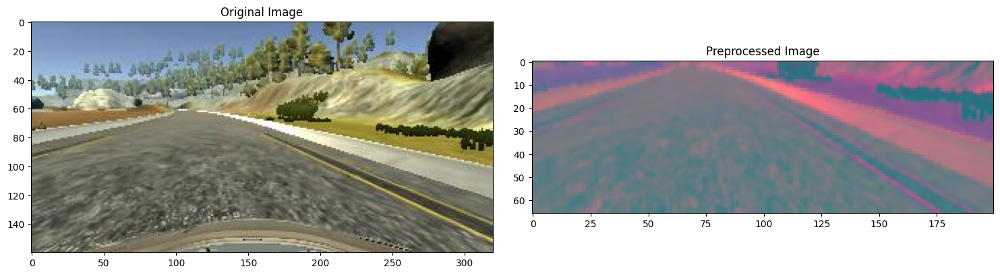

In [77]:
image = image_paths[100]
original_image = mp.imread(image)
preprocessed_image = img_preprocess(image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [78]:
# def batch_generator(image_paths, steering_ang, batch_size, istraining):
#     while True:
#         batch_img = []
#         batch_steering = []
         
#         for i in range(batch_size):
#             random_index = random.randint(0, len(image_paths) - 1)
            
#             if istraining:
#                 im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
               
#             else:
#                 im = mp.imread(image_paths[random_index])
#             im = img_preprocess(im)
#             batch_img.append(im)
#             batch_steering.append(steering)
#         yield (np.asarray(batch_img), np.asarray(batch_steering)) 

In [79]:
# x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
# x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
# fig, axs = plt.subplots(1, 2, figsize=(15, 10))
# fig.tight_layout()
 
# axs[0].imshow(x_train_gen[0])
# axs[0].set_title('Training Image')
 
# axs[1].imshow(x_valid_gen[0])
# axs[1].set_title('Validation Image')

In [80]:
X_train = np.array(list(map(img_preprocess, X_train)))
X_valid = np.array(list(map(img_preprocess, X_valid)))

(874, 66, 200, 3)


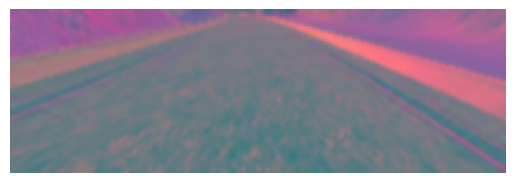

In [81]:
plt.imshow(X_train[random.randint(0, len(X_train) - 1)])
plt.axis('off')
print(X_train.shape)

In [87]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))
 
    model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
    model.add(Dropout(0.5))
    
    
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dropout(0.5))
    
    
    model.add(Dense(50, activation='elu'))
    model.add(Dropout(0.5))
    
    model.add(Dense(10, activation ='elu'))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    
    
    optimizer= Adam(learning_rate=0.003)
    model.compile(loss='mse', optimizer=optimizer)
    
    return model

In [88]:
model = nvidia_model()
print(model.summary())

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 18, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [89]:
# history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
#                                   steps_per_epoch=300, 
#                                   epochs=10,

# validation_data=batch_generator(X_valid, y_valid, 100, 0),
#                                   validation_steps=200,
#                                   verbose=1,
#                                   shuffle = 1)

In [90]:
history = model.fit(X_train, y_train, epochs=30, validation_data=(X_valid, y_valid), batch_size=100, verbose=1, shuffle=1)

Epoch 1/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 20.3671 - val_loss: 8.1403
Epoch 2/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 8.2071 - val_loss: 0.8906
Epoch 3/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 18.4598 - val_loss: 6.4099
Epoch 4/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 11.5342 - val_loss: 0.9770
Epoch 5/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 4.5064 - val_loss: 1.9934
Epoch 6/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 3.2142 - val_loss: 0.9726
Epoch 7/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 2.4875 - val_loss: 0.7097
Epoch 8/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 2.6534 - val_loss: 0.6110
Epoch 9/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 2.8928 - val_loss: 0.7589
Epoch 10/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 2.5551 - val_loss: 0.3575
Epoch 11/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 2.2367 - val_loss: 0.3085
Epoch 12/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 2.2532 - val_loss: 0.463

Text(0.5, 0, 'Epoch')

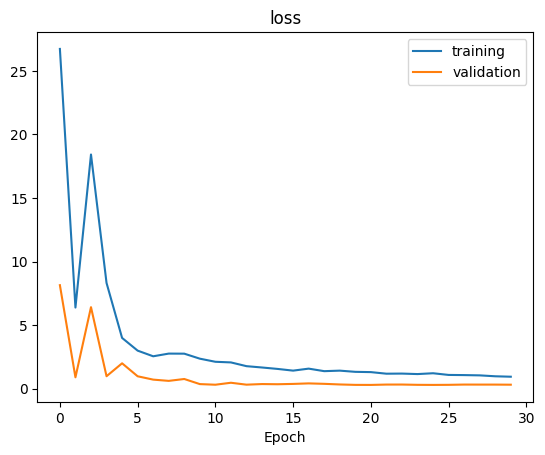

In [91]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('loss')
plt.xlabel('Epoch')

In [92]:
model.save('model.h5')